In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
%matplotlib inline
import matplotlib.pyplot as plt  # Matlab-style plotting
import seaborn as sns
color = sns.color_palette()
sns.set_style('darkgrid')
import warnings
def ignore_warn(*args, **kwargs):
    pass
warnings.warn = ignore_warn #ignore annoying warning (from sklearn and seaborn)


from scipy import stats
from scipy.stats import norm, skew #for some statistics
pd.set_option('display.float_format', lambda x: '{:.3f}'.format(x)) 

In [2]:
abspath = '/home/semipro321/Documents/Workspace/Geospatial-Analysis-on-House-Price-Prediction/'
df = pd.read_csv(abspath + 'Inputs/mastermodel_filled_Airbnbfix.csv')


In [3]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.3,random_state=23)

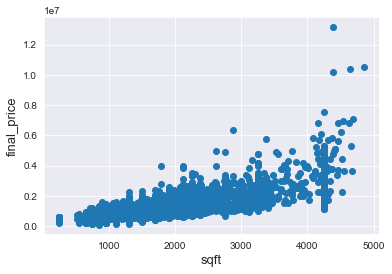

In [4]:
fig, ax = plt.subplots()
ax.scatter(x = train['sqft'], y = train['final_price'])
plt.ylabel('final_price', fontsize=13)
plt.xlabel('sqft', fontsize=13)
plt.show()

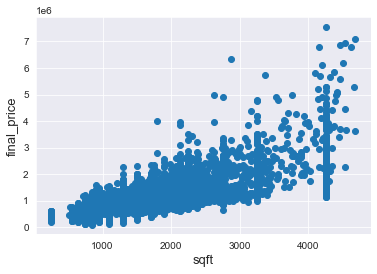

In [5]:
#Deleting outliers
train = train.drop(train[(train['sqft']>4000) & (train['final_price']>8000000)].index)

#Check the graphic again
fig, ax = plt.subplots()
ax.scatter(train['sqft'], train['final_price'])
plt.ylabel('final_price', fontsize=13)
plt.xlabel('sqft', fontsize=13)
plt.show()

In [6]:
ntrain = train.shape[0]
ntest = test.shape[0]
all_data = pd.concat((train, test)).reset_index(drop=True)


 mu = 880038.04 and sigma = 596235.96



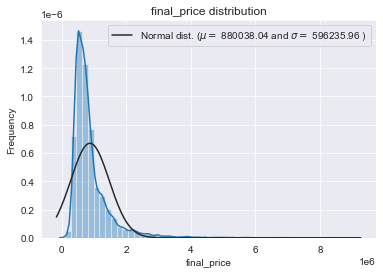

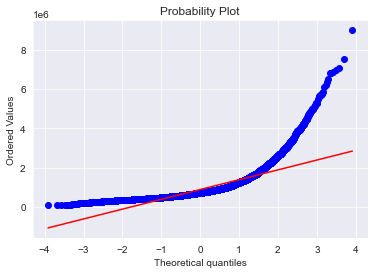

In [7]:
sns.distplot(all_data['final_price'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(all_data['final_price'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

#Now plot the distribution
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('final_price distribution')

#Get also the QQ-plot
fig = plt.figure()
res = stats.probplot(all_data['final_price'], plot=plt)
plt.show()

In [8]:
log_col = ['sqft','mean_district_income','final_price','dist_nearest_school', 'dist_nearest_ttc', 'dist_nearest_park', 'dist_nearest_hospital']


 mu = 7.03 and sigma = 0.55



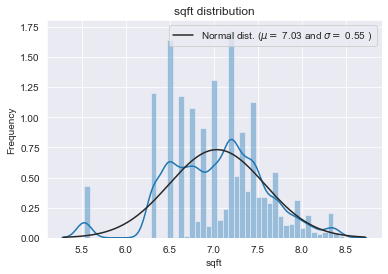

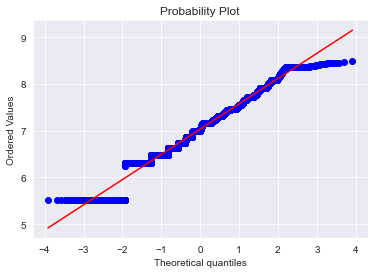


 mu = 10.83 and sigma = 0.42



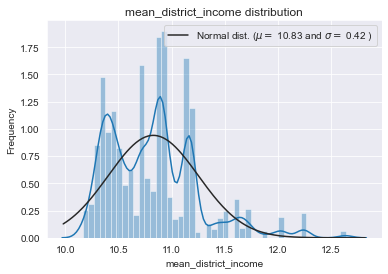

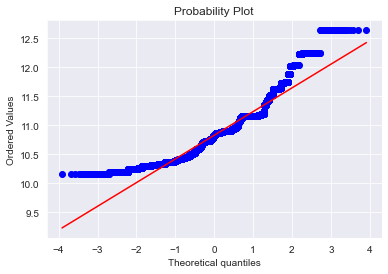


 mu = 13.54 and sigma = 0.51



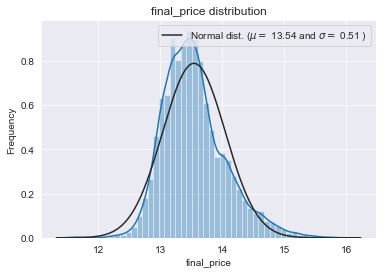

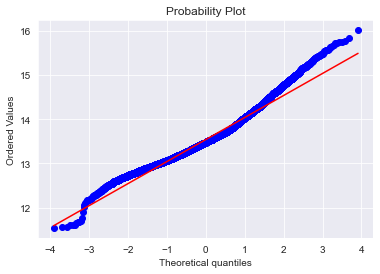


 mu = 5.77 and sigma = 0.73



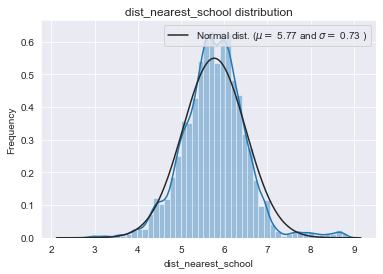

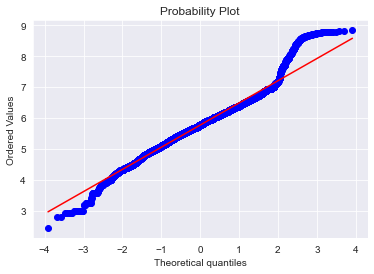


 mu = 7.39 and sigma = 0.85



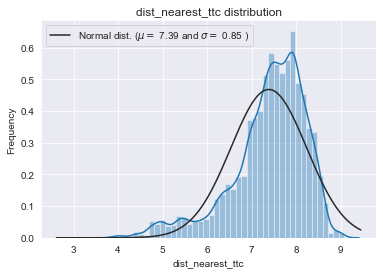

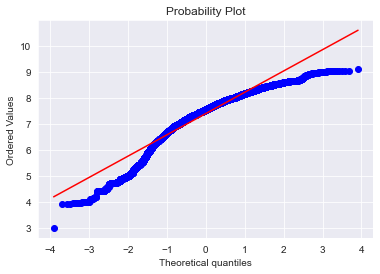

KeyError: 'dist_nearest_park'

In [9]:
for i in log_col:
    #We use the numpy fuction log1p which  applies log(1+x) to all elements of the column
    all_data[i] = np.log1p(all_data[i])

    #Check the new distribution 
    sns.distplot(all_data[i] , fit=norm);

    # Get the fitted parameters used by the function
    (mu, sigma) = norm.fit(all_data[i])
    print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))

    #Now plot the distribution
    plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
                loc='best')
    plt.ylabel('Frequency')
    plt.title(f'{i} distribution')

    #Get also the QQ-plot
    fig = plt.figure()
    res = stats.probplot(all_data[i], plot=plt)
    plt.show()

In [10]:
neighdumcol = [col for col in train.columns if 'neighbourhood' in col]
typedumcol = [col for col in train.columns if 'type' in col]
dumcol = neighdumcol + typedumcol

In [11]:
numeric_feats = train.drop(columns=dumcol).columns

# Check the skew of all numerical features
skewed_feats = all_data[numeric_feats].apply(lambda x: skew(x.dropna())).sort_values(ascending=False)
print("\nSkew in numerical features: \n")
skewness = pd.DataFrame({'Skew' :skewed_feats})
skewness.head(10)


Skew in numerical features: 



,Skew
Airbnb500m_YOY1519,2.877
Airbnb1000m_YOY1519,2.651
violent_crime500m,2.481
violent_crime1000m,2.317
parking,2.009
bathrooms,1.658
Auto Theft500m,1.398
Auto Theft1000m,1.337
bedrooms_bg,1.262
mean_district_income,1.046


In [12]:
# skewness = skewness[abs(skewness) > 0.75]
# print("There are {} skewed numerical features to Box Cox transform".format(skewness.shape[0]))

# from scipy.special import boxcox1p
# skewed_features = skewness.index
# lam = 0.15
# for feat in skewed_features:
#     #all_data[feat] += 1
#     all_data[feat] = boxcox1p(all_data[feat], lam)
    

In [13]:
y_train = all_data[:ntrain].final_price.values
y_test = all_data[ntrain:].final_price.values
all_data.drop(['final_price'], axis=1, inplace=True)
train = all_data[:ntrain]
test = all_data[ntrain:]

In [14]:
from sklearn.linear_model import ElasticNet, Lasso,  BayesianRidge, LassoLarsIC
from sklearn.ensemble import RandomForestRegressor,  GradientBoostingRegressor
from sklearn.linear_model import LinearRegression 
from sklearn.kernel_ridge import KernelRidge
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.base import BaseEstimator, TransformerMixin, RegressorMixin, clone
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from sklearn.metrics import mean_squared_error
import xgboost as xgb
import lightgbm as lgb

In [15]:
lasso = make_pipeline(RobustScaler(), Lasso(alpha =0.0005, random_state=1))

linear = make_pipeline(RobustScaler(), LinearRegression())
ENet = make_pipeline(RobustScaler(), ElasticNet(alpha=0.0005, l1_ratio=.9, random_state=3))

KRR = KernelRidge(alpha=0.6, kernel='polynomial', degree=2, coef0=2.5)

GBoost = GradientBoostingRegressor(n_estimators=3000, learning_rate=0.05,
                                   max_depth=4, max_features='sqrt',
                                   min_samples_leaf=15, min_samples_split=10, 
                                   loss='huber', random_state =5)

model_xgb = xgb.XGBRegressor(colsample_bytree=0.4603, gamma=0.0468, 
                             learning_rate=0.05, max_depth=3, 
                             min_child_weight=1.7817, n_estimators=2200,
                             reg_alpha=0.4640, reg_lambda=0.8571,
                             subsample=0.5213, silent=1,
                             random_state =7, nthread = -1)


model_lgb = lgb.LGBMRegressor(objective='regression',num_leaves=5,
                              learning_rate=0.05, n_estimators=720,
                              max_bin = 55, bagging_fraction = 0.8,
                              bagging_freq = 5, feature_fraction = 0.2319,
                              feature_fraction_seed=9, bagging_seed=9,
                              min_data_in_leaf =6, min_sum_hessian_in_leaf = 11)

In [16]:
n_folds = 5

def rmsle_cv(model):
    kf = KFold(n_folds, shuffle=True, random_state=42).get_n_splits(train.values)
    rmse= np.sqrt(-cross_val_score(model, train.values, y_train, scoring="neg_mean_squared_error", cv = kf))
    return(rmse)

In [17]:
score = rmsle_cv(linear)
print("\nLinear score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()))


Lasso score: 0.1670 (0.0012)



In [18]:
score = rmsle_cv(lasso)
print("\nLasso score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()))


Lasso score: 0.1846 (0.0015)



In [19]:
score = rmsle_cv(ENet)
print("ElasticNet score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()))

ElasticNet score: 0.1828 (0.0015)



In [20]:
score = rmsle_cv(KRR)
print("Kernel Ridge score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()))

/home/semipro321/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.07247e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, sym_pos=True,
Kernel Ridge score: 0.1616 (0.0028)



In [21]:
score = rmsle_cv(GBoost)
print("Gradient Boosting score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()))

Gradient Boosting score: 0.1335 (0.0028)



In [22]:
score = rmsle_cv(model_xgb)
print("Xgboost score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()))

[11:18:23] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[11:18:36] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[11:18:51] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[11:19:05] WARNING: ..

In [23]:
score = rmsle_cv(model_lgb)
print("LGBM score: {:.4f} ({:.4f})\n" .format(score.mean(), score.std()))

[LightGBM] [Warning] feature_fraction is set=0.2319, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2319
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=11, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=11
[LightGBM] [Warning] min_data_in_leaf is set=6, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] feature_fraction is set=0.2319, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2319
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=11, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=11
[LightGBM] [Warning] min_data_in_leaf is set=6, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6

In [24]:
class AveragingModels(BaseEstimator, RegressorMixin, TransformerMixin):
    def __init__(self, models):
        self.models = models
        
    # we define clones of the original models to fit the data in
    def fit(self, X, y):
        self.models_ = [clone(x) for x in self.models]
        
        # Train cloned base models
        for model in self.models_:
            model.fit(X, y)

        return self
    
    #Now we do the predictions for cloned models and average them
    def predict(self, X):
        predictions = np.column_stack([
            model.predict(X) for model in self.models_
        ])
        return np.mean(predictions, axis=1)  

In [35]:
averaged_models = AveragingModels(models = (ENet, GBoost, KRR, linear))

score = rmsle_cv(averaged_models)
print(" Averaged base models score: {:.4f} ({:.4f})\n".format(score.mean(), score.std()))

/home/semipro321/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:187: LinAlgWarning: Ill-conditioned matrix (rcond=1.07247e-16): result may not be accurate.
  dual_coef = linalg.solve(K, y, sym_pos=True,
 Averaged base models score: 0.1494 (0.0015)



In [26]:
class StackingAveragedModels(BaseEstimator, RegressorMixin, TransformerMixin):
    def __init__(self, base_models, meta_model, n_folds=5):
        self.base_models = base_models
        self.meta_model = meta_model
        self.n_folds = n_folds
   
    # We again fit the data on clones of the original models
    def fit(self, X, y):
        self.base_models_ = [list() for x in self.base_models]
        self.meta_model_ = clone(self.meta_model)
        kfold = KFold(n_splits=self.n_folds, shuffle=True, random_state=156)
        
        # Train cloned base models then create out-of-fold predictions
        # that are needed to train the cloned meta-model
        out_of_fold_predictions = np.zeros((X.shape[0], len(self.base_models)))
        for i, model in enumerate(self.base_models):
            for train_index, holdout_index in kfold.split(X, y):
                instance = clone(model)
                self.base_models_[i].append(instance)
                instance.fit(X[train_index], y[train_index])
                y_pred = instance.predict(X[holdout_index])
                out_of_fold_predictions[holdout_index, i] = y_pred
                
        # Now train the cloned  meta-model using the out-of-fold predictions as new feature
        self.meta_model_.fit(out_of_fold_predictions, y)
        return self
   
    #Do the predictions of all base models on the test data and use the averaged predictions as 
    #meta-features for the final prediction which is done by the meta-model
    def predict(self, X):
        meta_features = np.column_stack([
            np.column_stack([model.predict(X) for model in base_models]).mean(axis=1)
            for base_models in self.base_models_ ])
        return self.meta_model_.predict(meta_features)

In [36]:
stacked_averaged_models = StackingAveragedModels(base_models = (ENet, GBoost, KRR),
                                                 meta_model = linear)

score = rmsle_cv(stacked_averaged_models)
print("Stacking Averaged models score: {:.4f} ({:.4f})".format(score.mean(), score.std()))

Stacking Averaged models score: 0.1331 (0.0027)


In [37]:
def rmsle(y, y_pred):
    return np.sqrt(mean_squared_error(y, y_pred))

In [38]:
stacked_averaged_models.fit(train.values, y_train)
stacked_train_pred = stacked_averaged_models.predict(train.values)
stacked_pred = np.expm1(stacked_averaged_models.predict(test.values))
print(rmsle(y_train, stacked_train_pred))
# stacked_averaged_models.fit(train.values, y_train)
# stacked_test_pred = np.expm1(stacked_averaged_models.predict(test.values))
# # stacked_pred = np.expm1(stacked_averaged_models.predict(test.values))
# print(rmsle(y_test, stacked_tn_pred))

0.10825237023647809


0.10249438243360438


In [39]:
model_xgb.fit(train, y_train)
xgb_train_pred = model_xgb.predict(train)
xgb_pred = np.expm1(model_xgb.predict(test))
print(rmsle(y_train, xgb_train_pred))

[13:03:36] WARNING: ../src/learner.cc:541: 
Parameters: { silent } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


0.10993908948820356


In [42]:
GBoost.fit(train, y_train)
lgb_train_pred = GBoost.predict(train)
lgb_pred = np.expm1(GBoost.predict(test.values))
print(rmsle(y_train, lgb_train_pred))

0.10674662312315077


In [43]:
'''RMSE on the entire Train data when averaging'''

print('RMSLE score on train data:')
print(rmsle(y_train,stacked_train_pred*0.70 +
               xgb_train_pred*0.15 + lgb_train_pred*0.15 ))

RMSLE score on train data:
0.1070505766603846


In [74]:
# ensemble = stacked_pred*0.70 + xgb_pred*0.15 + lgb_pred*0.15
ensemble = stacked_pred*0.70 + xgb_pred*0.30

In [48]:
ensemble

array([1051277.7091032 ,  448444.11716365,  643767.08625321, ...,
       1065774.57342354, 1140807.31613832, 1847471.57927549])

In [71]:
rmsle(y_test, np.log1p(ensemble))

0.1320359771744638

In [50]:
np.expm1(y_test)

array([1230000.,  492500.,  660000., ..., 1960000., 1245000., 2166800.])

In [51]:
y_test.shape

(4571,)

In [53]:
ensemble

array([1051277.7091032 ,  448444.11716365,  643767.08625321, ...,
       1065774.57342354, 1140807.31613832, 1847471.57927549])

In [57]:
from sklearn.metrics import mean_absolute_error
mean_absolute_error(np.expm1(y_test), ensemble)

94567.0035643188

In [75]:
linear.fit(train, y_train)
lin_pred = linear.predict(test)
rmsle(y_test, lin_pred)

0.17132915541389132